In [1]:
library(Seurat)
library(scRepertoire)

The legacy packages maptools, rgdal, and rgeos, underpinning this package
will retire shortly. Please refer to R-spatial evolution reports on
https://r-spatial.org/r/2023/05/15/evolution4.html for details.
This package is now running under evolution status 0 

Attaching SeuratObject

Loading required package: ggplot2



In [2]:
FT1 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT1/outs/per_sample_outs/FT1/vdj_t/filtered_contig_annotations.csv")
FT2 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT2/outs/per_sample_outs/FT2/vdj_t/filtered_contig_annotations.csv")
FT3 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT3/outs/per_sample_outs/FT3/vdj_t/filtered_contig_annotations.csv")
FT4 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT4/outs/per_sample_outs/FT4/vdj_t/filtered_contig_annotations.csv")
FT5 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT5/outs/per_sample_outs/FT5/vdj_t/filtered_contig_annotations.csv")

contig_list <- list(FT1,FT2,FT3,FT4,FT5)

combined <- combineTCR(contig_list,
                      samples = c("FT1","FT2","FT3","FT4","FT5"),
                      cells = "T-AB",
                      #ID = c("a","a","a","c","c"),
                      removeNA = T,
                      removeMulti = T)

In [3]:
FT_data <- readRDS("/home/jurny0402/TCR_explore/Annotated_Tcells/230831_tcells1_annotated.rds")

In [5]:
View(FT_data@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,sampleID,tissue_type,nCount_SCT,nFeature_SCT,SCT_snn_res.1,seurat_clusters,SCT_snn_res.0.5,SCT_snn_res.0.3,SCT_snn_res.0.4,SCT_snn_res.0.6,SCT_snn_res.0.7,SCT_snn_res.0.8,SCT_snn_res.1.5,SCT_snn_res.1.3,SCT_snn_res.2,SCT_snn_res.3
,<chr>,<dbl>,<int>,<dbl>,<chr>,<chr>,<dbl>,<int>,<fct>,<fct>,<fct>,<chr>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
Thy1_AGCTCAAAGCAAGTCG-1,Thy1,21504,5543,2.943638,Thy1,normal,2387,1535,6,1,1,2,0,6,8,8,8,8,5,1
Thy1_AGCTTCCTCACTTTGT-1,Thy1,20854,5627,6.703750,Thy1,normal,2390,1529,17,12,12,2,17,13,13,14,23,22,26,36
Thy1_GCTACAACAAACTAGA-1,Thy1,17864,4920,4.422302,Thy1,normal,2413,1456,12,5,5,2,0,2,3,2,10,11,19,13
Thy1_GACCTTCTCGTTCGCT-1,Thy1,17580,4962,2.053470,Thy1,normal,2583,1677,17,12,12,4,3,13,13,14,23,22,26,36
Thy1_GGAGCAACAACTTGCA-1,Thy1,16246,4858,4.887357,Thy1,normal,2288,1481,6,3,3,2,0,6,8,8,21,20,23,27
Thy1_TCATGCCTCGCTTTAT-1,Thy1,18188,4784,4.332527,Thy1,normal,2586,1542,17,12,12,4,3,13,13,14,23,22,26,36
Thy1_GCAACATAGTACAACA-1,Thy1,15900,4783,4.855346,Thy1,normal,2398,1599,11,6,6,2,0,8,6,5,9,2,0,3
Thy1_AAGCCATAGTTGGAGC-1,Thy1,15175,4895,4.230643,Thy1,normal,2316,1581,10,0,0,2,0,6,0,0,7,7,6,20
Thy1_GATGACTTCTGGGAGA-1,Thy1,14804,4778,6.450959,Thy1,normal,2289,1555,6,1,1,2,0,6,8,8,8,8,5,1


In [22]:
combined

barcode,sample,TCR1,cdr3_aa1,cdr3_nt1,TCR2,cdr3_aa2,cdr3_nt2,CTgene,CTnt,CTaa,CTstrict,cellType
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
FT1_AAACCTGCACCGGAAA-1,FT1,TRAV29/DV5.TRAJ44.TRAC,CAAIRYTGTASKLTF,TGTGCAGCAATCCGCTATACCGGCACTGCCAGTAAACTCACCTTT,TRBV24-1.NA.TRBJ1-5.TRBC1,CATSDKYLNQPQHF,TGTGCCACCAGTGATAAATACCTCAATCAGCCCCAGCATTTT,TRAV29/DV5.TRAJ44.TRAC_TRBV24-1.NA.TRBJ1-5.TRBC1,TGTGCAGCAATCCGCTATACCGGCACTGCCAGTAAACTCACCTTT_TGTGCCACCAGTGATAAATACCTCAATCAGCCCCAGCATTTT,CAAIRYTGTASKLTF_CATSDKYLNQPQHF,TRAV29/DV5.TRAJ44.TRAC_TGTGCAGCAATCCGCTATACCGGCACTGCCAGTAAACTCACCTTT_TRBV24-1.NA.TRBJ1-5.TRBC1_TGTGCCACCAGTGATAAATACCTCAATCAGCCCCAGCATTTT,T-AB
FT1_AAACCTGGTCTTGTCC-1,FT1,TRAV30.TRAJ23.TRAC,CGTEIYNQGGKLIF,TGCGGCACAGAGATCTATAACCAGGGAGGAAAGCTTATCTTC,TRBV12-3.NA.TRBJ1-2.TRBC1,CASSVGPQVGNYGYTF,TGTGCCAGCAGCGTGGGACCCCAGGTCGGGAACTATGGCTACACCTTC,TRAV30.TRAJ23.TRAC_TRBV12-3.NA.TRBJ1-2.TRBC1,TGCGGCACAGAGATCTATAACCAGGGAGGAAAGCTTATCTTC_TGTGCCAGCAGCGTGGGACCCCAGGTCGGGAACTATGGCTACACCTTC,CGTEIYNQGGKLIF_CASSVGPQVGNYGYTF,TRAV30.TRAJ23.TRAC_TGCGGCACAGAGATCTATAACCAGGGAGGAAAGCTTATCTTC_TRBV12-3.NA.TRBJ1-2.TRBC1_TGTGCCAGCAGCGTGGGACCCCAGGTCGGGAACTATGGCTACACCTTC,T-AB
FT1_AAACCTGTCTACGAGT-1,FT1,TRAV19.TRAJ53.TRAC,CALRRSGGSNYKLTF,TGTGCTCTGAGAAGAAGTGGAGGTAGCAACTATAAACTGACATTT,TRBV29-1.NA.TRBJ2-5.TRBC2,CSVEGGLSSGTQYF,TGCAGCGTTGAAGGGGGCCTGAGTTCCGGGACCCAGTACTTC,TRAV19.TRAJ53.TRAC_TRBV29-1.NA.TRBJ2-5.TRBC2,TGTGCTCTGAGAAGAAGTGGAGGTAGCAACTATAAACTGACATTT_TGCAGCGTTGAAGGGGGCCTGAGTTCCGGGACCCAGTACTTC,CALRRSGGSNYKLTF_CSVEGGLSSGTQYF,TRAV19.TRAJ53.TRAC_TGTGCTCTGAGAAGAAGTGGAGGTAGCAACTATAAACTGACATTT_TRBV29-1.NA.TRBJ2-5.TRBC2_TGCAGCGTTGAAGGGGGCCTGAGTTCCGGGACCCAGTACTTC,T-AB
FT1_AAACGGGCAATAAGCA-1,FT1,TRAV13-2.TRAJ30.TRAC,CAVSMNRDDKIIF,TGTGCAGTGTCCATGAACAGAGATGACAAGATCATCTTT,TRBV5-1.NA.TRBJ1-4.TRBC1,CASSLAGSTNEKLFF,TGCGCCAGCAGCTTGGCGGGCTCAACTAATGAAAAACTGTTTTTT,TRAV13-2.TRAJ30.TRAC_TRBV5-1.NA.TRBJ1-4.TRBC1,TGTGCAGTGTCCATGAACAGAGATGACAAGATCATCTTT_TGCGCCAGCAGCTTGGCGGGCTCAACTAATGAAAAACTGTTTTTT,CAVSMNRDDKIIF_CASSLAGSTNEKLFF,TRAV13-2.TRAJ30.TRAC_TGTGCAGTGTCCATGAACAGAGATGACAAGATCATCTTT_TRBV5-1.NA.TRBJ1-4.TRBC1_TGCGCCAGCAGCTTGGCGGGCTCAACTAATGAAAAACTGTTTTTT,T-AB
FT1_AAACGGGTCGTTGCCT-1,FT1,TRAV10.TRAJ26.TRAC,CVVRRDNYGQNFVF,TGTGTGGTGAGGCGGGATAACTATGGTCAGAATTTTGTCTTT,TRBV6-5.NA.TRBJ1-1.TRBC1,CASSYLPSGLAPMNTEAFF,TGTGCCAGCAGTTACCTGCCCAGCGGGCTAGCCCCTATGAACACTGAAGCTTTCTTT,TRAV10.TRAJ26.TRAC_TRBV6-5.NA.TRBJ1-1.TRBC1,TGTGTGGTGAGGCGGGATAACTATGGTCAGAATTTTGTCTTT_TGTGCCAGCAGTTACCTGCCCAGCGGGCTAGCCCCTATGAACACTGAAGCTTTCTTT,CVVRRDNYGQNFVF_CASSYLPSGLAPMNTEAFF,TRAV10.TRAJ26.TRAC_TGTGTGGTGAGGCGGGATAACTATGGTCAGAATTTTGTCTTT_TRBV6-5.NA.TRBJ1-1.TRBC1_TGTGCCAGCAGTTACCTGCCCAGCGGGCTAGCCCCTATGAACACTGAAGCTTTCTTT,T-AB
FT1_AAAGATGAGTACACCT-1,FT1,TRAV35.TRAJ56.TRAC,CAGQAGANSKLTF,TGTGCTGGGCAGGCTGGAGCCAATAGTAAGCTGACATTT,TRBV20-1.NA.TRBJ2-5.TRBC2,CSARPGNRGKETQYF,TGCAGTGCTAGGCCCGGCAACAGGGGGAAAGAGACCCAGTACTTC,TRAV35.TRAJ56.TRAC_TRBV20-1.NA.TRBJ2-5.TRBC2,TGTGCTGGGCAGGCTGGAGCCAATAGTAAGCTGACATTT_TGCAGTGCTAGGCCCGGCAACAGGGGGAAAGAGACCCAGTACTTC,CAGQAGANSKLTF_CSARPGNRGKETQYF,TRAV35.TRAJ56.TRAC_TGTGCTGGGCAGGCTGGAGCCAATAGTAAGCTGACATTT_TRBV20-1.NA.TRBJ2-5.TRBC2_TGCAGTGCTAGGCCCGGCAACAGGGGGAAAGAGACCCAGTACTTC,T-AB
FT1_AAAGATGTCGCCAAAT-1,FT1,TRAV21.TRAJ20.TRAC,CAVEPNDYKLSF,TGTGCTGTGGAGCCTAACGACTACAAGCTCAGCTTT,TRBV19.NA.TRBJ2-2.TRBC2,CASSLSGGAYTGELFF,TGTGCCAGTAGTCTTTCAGGGGGCGCATACACCGGGGAGCTGTTTTTT,TRAV21.TRAJ20.TRAC_TRBV19.NA.TRBJ2-2.TRBC2,TGTGCTGTGGAGCCTAACGACTACAAGCTCAGCTTT_TGTGCCAGTAGTCTTTCAGGGGGCGCATACACCGGGGAGCTGTTTTTT,CAVEPNDYKLSF_CASSLSGGAYTGELFF,TRAV21.TRAJ20.TRAC_TGTGCTGTGGAGCCTAACGACTACAAGCTCAGCTTT_TRBV19.NA.TRBJ2-2.TRBC2_TGTGCCAGTAGTCTTTCAGGGGGCGCATACACCGGGGAGCTGTTTTTT,T-AB
FT1_AAAGATGTCTCCTATA-1,FT1,TRAV8-3.TRAJ41.TRAC,CAVGANSGYALNF,TGTGCTGTGGGTGCGAATTCCGGGTATGCACTCAACTTC,TRBV12-4.NA.TRBJ1-1.TRBC1,CASSFDLVGLVNTEAFF,TGTGCCAGCAGTTTTGATCTCGTGGGGTTGGTTAACACTGAAGCTTTCTTT,TRAV8-3.TRAJ41.TRAC_TRBV12-4.NA.TRBJ1-1.TRBC1,TGTGCTGTGGGTGCGAATTCCGGGTATGCACTCAACTTC_TGTGCCAGCAGTTTTGATCTCGTGGGGTTGGTTAACACTGAAG

In [8]:
unique(FT_data@meta.data$orig.ident)

[1] "Thy1"  "Thy4"  "Thy5"  "Thy6"  "Thy10" "FT1"   "FT2"   "FT3"   "FT4"  
[10] "FT5"

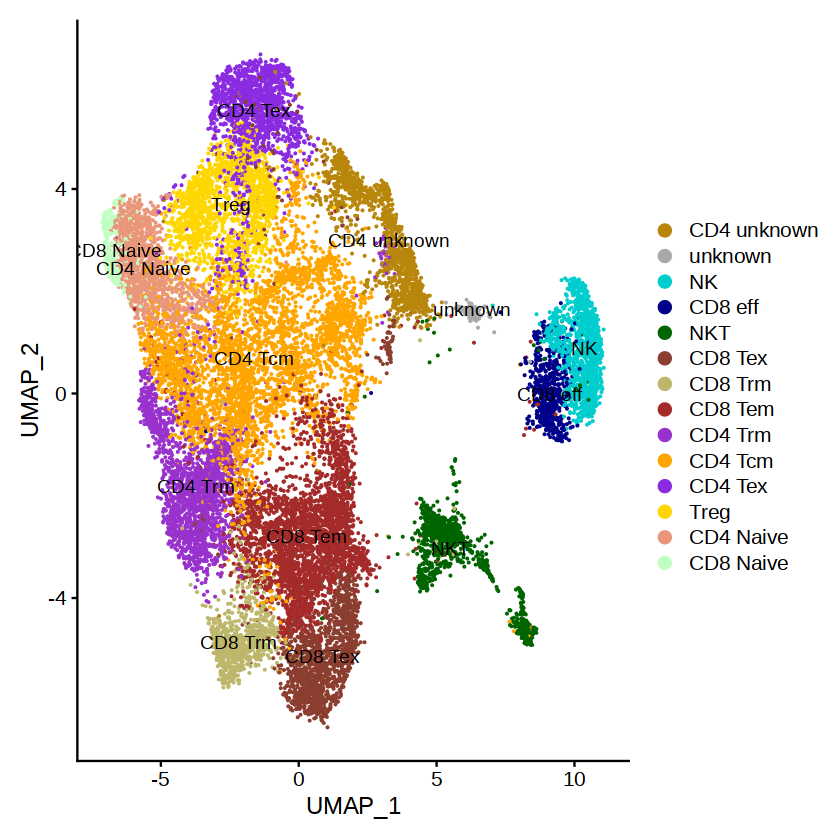

In [91]:
colors <- c("darkgoldenrod", "darkgrey", "cyan3","darkblue","darkgreen","coral4","darkkhaki","brown","darkorchid","orange","blueviolet","gold1","darksalmon","darkseagreen1")
DimPlot(FT_data, label = T, label.size = 4, cols = colors)

In [4]:
adenoma <- subset(FT_data, subset = orig.ident == "FT1"|orig.ident == "FT2"|orig.ident == "FT3")
carcinoma <- subset(FT_data, subset = orig.ident == "FT4"|orig.ident == "FT5")

In [18]:
View(FT_data@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,sampleID,tissue_type,nCount_SCT,nFeature_SCT,SCT_snn_res.1,seurat_clusters,⋯,SCT_snn_res.1.3,SCT_snn_res.2,SCT_snn_res.3,barcode,CTgene,CTnt,CTaa,CTstrict,Frequency,cloneType
,<chr>,<dbl>,<int>,<dbl>,<chr>,<chr>,<dbl>,<int>,<fct>,<fct>,⋯,<fct>,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<lgl>
Thy1_AGCTCAAAGCAAGTCG-1,Thy1,21504,5543,2.943638,Thy1,normal,2387,1535,6,1,⋯,8,5,1,NA,NA,NA,NA,NA,NA,NA
Thy1_AGCTTCCTCACTTTGT-1,Thy1,20854,5627,6.703750,Thy1,normal,2390,1529,17,12,⋯,22,26,36,NA,NA,NA,NA,NA,NA,NA
Thy1_GCTACAACAAACTAGA-1,Thy1,17864,4920,4.422302,Thy1,normal,2413,1456,12,5,⋯,11,19,13,NA,NA,NA,NA,NA,NA,NA
Thy1_GACCTTCTCGTTCGCT-1,Thy1,17580,4962,2.053470,Thy1,normal,2583,1677,17,12,⋯,22,26,36,NA,NA,NA,NA,NA,NA,NA
Thy1_GGAGCAACAACTTGCA-1,Thy1,16246,4858,4.887357,Thy1,normal,2288,1481,6,3,⋯,20,23,27,NA,NA,NA,NA,NA,NA,NA
Thy1_TCATGCCTCGCTTTAT-1,Thy1,18188,4784,4.332527,Thy1,normal,2586,1542,17,12,⋯,22,26,36,NA,NA,NA,NA,NA,NA,NA
Thy1_GCAACATAGTACAACA-1,Thy1,15900,4783,4.855346,Thy1,normal,2398,1599,11,6,⋯,2,0,3,NA,NA,NA,NA,NA,NA,NA
Thy1_AAGCCATAGTTGGAGC-1,Thy1,15175,4895,4.230643,Thy1,normal,2316,1581,10,0,⋯,7,6,20,NA,NA,NA,NA,NA,NA,NA
Thy1_GATGACTTCTGGGAGA-1,Thy1,14804,4778,6.450959,Thy1,normal,2289,1555,6,1,⋯,8,5,1,NA,NA,NA,NA,NA,NA,NA


In [5]:
FT_data <- combineExpression(combined, 
                            FT_data,
                            cloneCall="gene",
                            proportion = FALSE, 
                            cloneTypes=c(Single=1, Small=5, Medium=20, Large=100, Hyperexpanded=500))

adenoma <- combineExpression(combined, 
                                  adenoma,
                                   cloneCall="gene",
                                   proportion = FALSE, 
                                   cloneTypes=c(Single=1, Small=5, Medium=20, Large=100, Hyperexpanded=500))

carcinoma <- combineExpression(combined, 
                                   carcinoma,
                                   cloneCall="gene",
                                   proportion = FALSE, 
                                   cloneTypes=c(Single=1, Small=5, Medium=20, Large=100, Hyperexpanded=500))

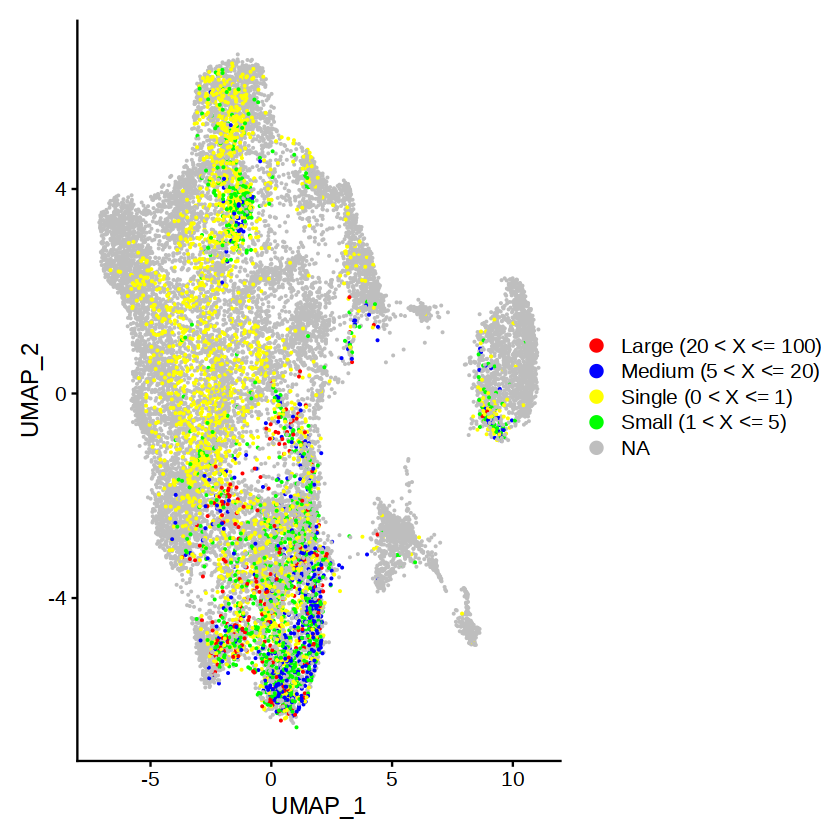

In [34]:
DimPlot(FT_data, group.by = "cloneType") +
    scale_color_manual(values = c("red","blue","yellow","green","orange"), na.value="grey") + 
  theme(plot.title = element_blank())

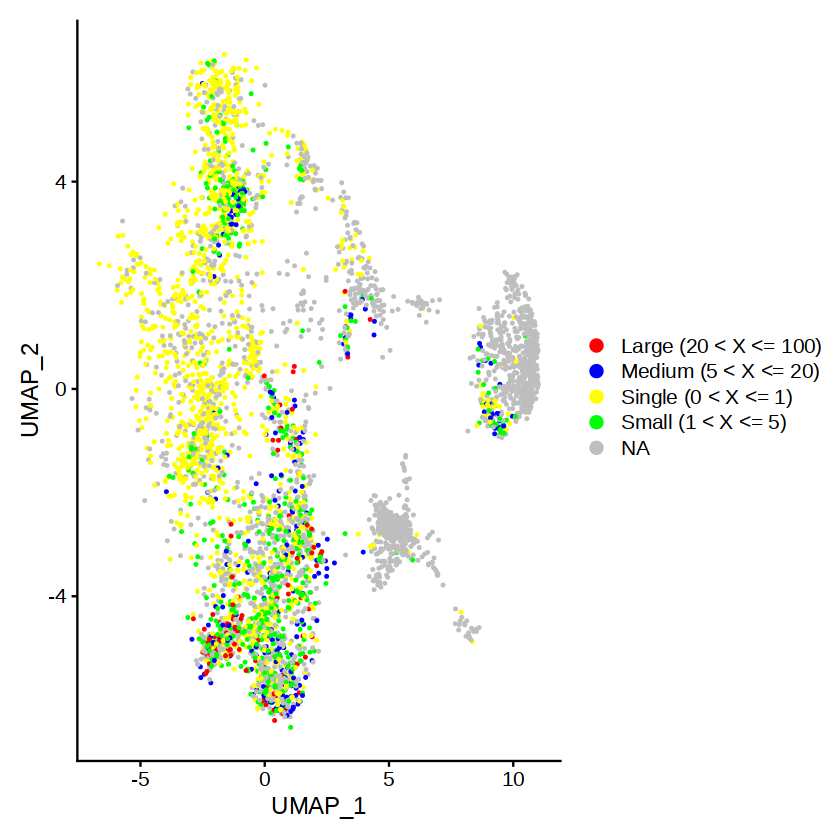

In [33]:
DimPlot(adenoma, group.by = "cloneType") +
    scale_color_manual(values = c("red","blue","yellow","green","orange"), na.value="grey") + 
  theme(plot.title = element_blank())

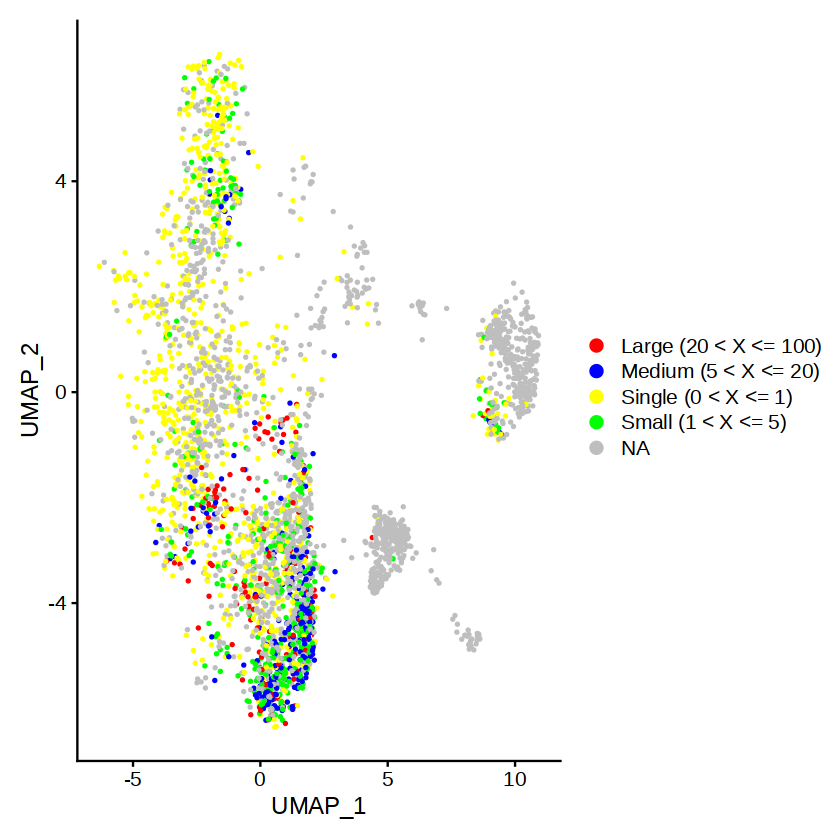

In [31]:
DimPlot(carcinoma, group.by = "cloneType") +
    scale_color_manual(values = c("red","blue","yellow","green","orange"), na.value="grey") + 
  theme(plot.title = element_blank())

In [6]:
FT_data_tumors <- subset(FT_data, subset=orig.ident=="FT1"|orig.ident=="FT2"|orig.ident=="FT3"|orig.ident=="FT4"|orig.ident=="FT5")

In [7]:
for (i in 1:nrow(FT_data_tumors)) {
    sample <- FT_data_tumors@meta.data[i,"orig.ident"]
    if(is.na(sample)){
        next
    }
    else if(sample == "FT1") {
        FT_data_tumors@meta.data[i,"ID"] <- c("a")
    }
    else if (sample == "FT2") {
        FT_data_tumors@meta.data[i,"ID"] <- c("a")
    }
    else if (sample == "FT3") {
        FT_data_tumors@meta.data[i,"ID"] <- c("a")
    }
    else if (sample == "FT4") {
        FT_data_tumors@meta.data[i,"ID"] <- c("c")
    }
    else if (sample == "FT5") {
        FT_data_tumors@meta.data[i,"ID"] <- c("c")
    }
}

In [85]:
FT_data_tumors@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,sampleID,tissue_type,nCount_SCT,nFeature_SCT,SCT_snn_res.1,seurat_clusters,⋯,SCT_snn_res.2,SCT_snn_res.3,barcode,CTgene,CTnt,CTaa,CTstrict,Frequency,cloneType,ID
,<chr>,<dbl>,<int>,<dbl>,<chr>,<chr>,<dbl>,<int>,<fct>,<fct>,⋯,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>
FT1_CTGCTGTAGGCTCTTA-1,FT1,15531,4830,3.1163479,FT1,tumor,2392,1477,7,1,⋯,8,35,FT1_CTGCTGTAGGCTCTTA-1,TRAV17.TRAJ29.TRAC_TRBV25-1.NA.TRBJ2-1.TRBC2,TGTGCTACGGACCCGAATTCAGGAAACACACCTCTTGTCTTT_TGTGCCAGCAGTAAGGGGGGATACAATGAGCAGTTCTTC,CATDPNSGNTPLVF_CASSKGGYNEQFF,TRAV17.TRAJ29.TRAC_TGTGCTACGGACCCGAATTCAGGAAACACACCTCTTGTCTTT_TRBV25-1.NA.TRBJ2-1.TRBC2_TGTGCCAGCAGTAAGGGGGGATACAATGAGCAGTTCTTC,1,Single (0 < X <= 1),a
FT1_GATCGTAAGGAGTTGC-1,FT1,14564,4943,1.1123318,FT1,tumor,2494,1637,5,6,⋯,0,10,FT1_GATCGTAAGGAGTTGC-1,TRAV5.TRAJ4.TRAC_TRBV20-1.TRBD2.TRBJ2-5.TRBC2,TGTGCAGAGACCGCTTCTGGTGGCTACAATAAGCTGATTTTT_TGCAGTGCCGGGACTAGCGGAGGTGAGACCCAGTACTTC,CAETASGGYNKLIF_CSAGTSGGETQYF,TRAV5.TRAJ4.TRAC_TGTGCAGAGACCGCTTCTGGTGGCTACAATAAGCTGATTTTT_TRBV20-1.TRBD2.TRBJ2-5.TRBC2_TGCAGTGCCGGGACTAGCGGAGGTGAGACCCAGTACTTC,2,Small (1 < X <= 5),a
FT1_GATGCTATCCAAACAC-1,FT1,11747,4589,1.0045118,FT1,tumor,2395,1688,12,5,⋯,19,13,NA,NA,NA,NA,NA,NA,NA,a
FT1_GGTGCGTAGAATAGGG-1,FT1,11345,4427,1.4808286,FT1,tumor,2400,1662,5,6,⋯,0,10,FT1_GGTGCGTAGAATAGGG-1,TRAV35.TRAJ39.TRAC_TRBV5-1.TRBD1.TRBJ1-5.TRBC1,TGTGCTGGGTATAATGCAGGCAACATGCTCACCTTT_TGCGCCAGCAGCTTGGGGGACAGGGAAGGGAATCAGCCCCAGCATTTT,CAGYNAGNMLTF_CASSLGDREGNQPQHF,TRAV35.TRAJ39.TRAC_TGTGCTGGGTATAATGCAGGCAACATGCTCACCTTT_TRBV5-1.TRBD1.TRBJ1-5.TRBC1_TGCGCCAGCAGCTTGGGGGACAGGGAAGGGAATCAGCCCCAGCATTTT,1,Single (0 < X <= 1),a
FT1_GACGGCTTCAGATAAG-1,FT1,10083,3782,1.6265000,FT1,tumor,2270,1309,3,7,⋯,18,12,NA,NA,NA,NA,NA,NA,NA,a
FT1_TTGGCAATCATCATTC-1,FT1,11462,4205,1.1429070,FT1,tumor,2491,1637,3,7,⋯,12,7,NA,NA,NA,NA,NA,NA,NA,a
FT1_CTCCTAGCACAAGACG-1,FT1,4312,2113,0.7189239,FT1,tumor,2933,1976,7,1,⋯,5,25,FT1_CTCCTAGCACAAGACG-1,TRAV1-2.TRAJ17.TRAC_TRBV6-1.NA.TRBJ2-6.TRBC2,TGTGCTGTGAGGCAAGCTGCAGGCAACAAGCTAACTTTT_TGTGCCAGCAGACTGACGGACACCCCTGGGGCCAACGTCCTGACTTTC,CAVRQAAGNKLTF_CASRLTDTPGANVLTF,TRAV1-2.TRAJ17.TRAC_TGTGCTGTGAGGCAAGCTGCAGGCAACAAGCTAACTTTT_TRBV6-1.NA.TRBJ2-6.TRBC2_TGTGCCAGCAGACTGACGGACACCCCTGGGGCCAACGTCCTGACTTTC,1,Single (0 < X <= 1),a
FT1_AGCTTGACAGCCTATA-1,FT1,10737,3913,0.9499860,FT1,tumor,2445,1493,7,1,⋯,8,35,NA,NA,NA,NA,NA,NA,NA,a
FT1_CATGCCTTCATCGCTC-1,FT1,9968,3849,1.3643660,FT1,tumor,2322,1437,12,5,⋯,19,13,NA,NA,NA,NA,NA,NA,NA,a


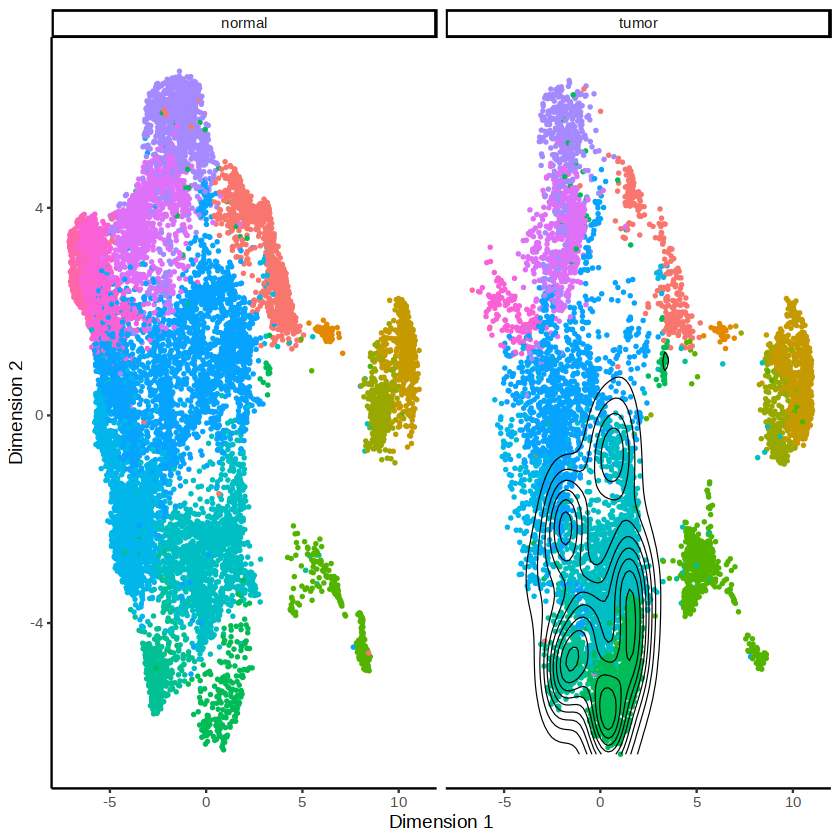

In [20]:
clonalOverlay(FT_data, 
              reduction = "umap", 
              freq.cutpoint = 20, 
              bins = 10,
             facet = "tissue_type") + guides(color = "none")

In [61]:
data <- clonalOverlay(FT_data, 
              reduction = "umap", 
              freq.cutpoint = 20, 
              bins = 10,
             facet = "tissue_type") + guides(color = "none")
unique(data$data$ident

[1] CD8 Tex     CD8 Tem     CD8 Trm     CD4 Tcm     CD4 unknown NKT        
[7] CD8 eff     CD4 Trm    
14 Levels: CD4 unknown unknown NK CD8 eff NKT CD8 Tex CD8 Trm ... CD8 Naive

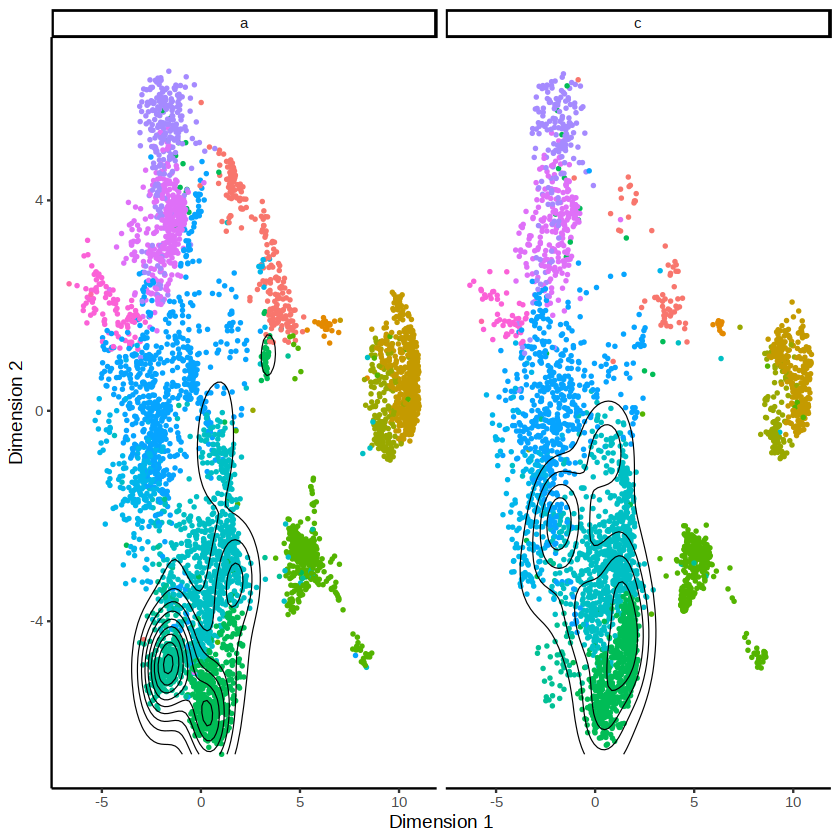

In [10]:
clonalOverlay(FT_data_tumors, 
              reduction = "umap", 
              freq.cutpoint = 20, 
              bins = 10,
             facet = "ID") + guides(color = "none")

In [70]:
data <- clonalOverlay(FT_data_tumors,
        reduction = "umap", 
        freq.cutpoint = 20, 
        bins = 10,
        facet = "ID") + guides(color = "none")
unique(data$data$ident)

[1] CD8 Tex     CD8 Tem     CD8 Trm     CD4 Tcm     CD4 unknown NKT        
[7] CD8 eff     CD4 Trm    
14 Levels: CD4 unknown unknown NK CD8 eff NKT CD8 Tex CD8 Trm ... CD8 Naive

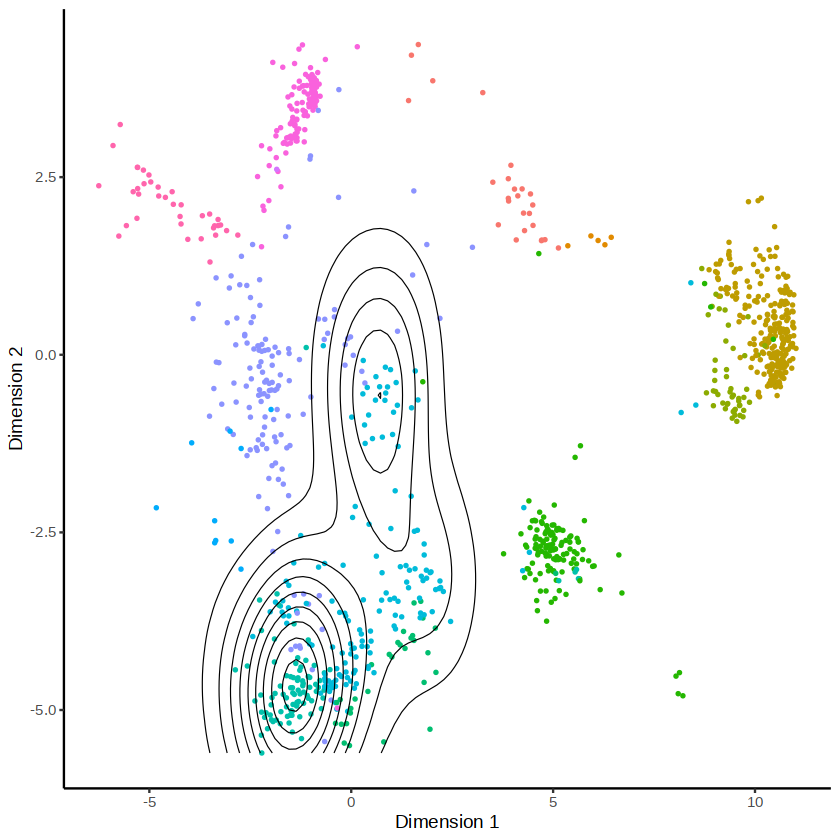

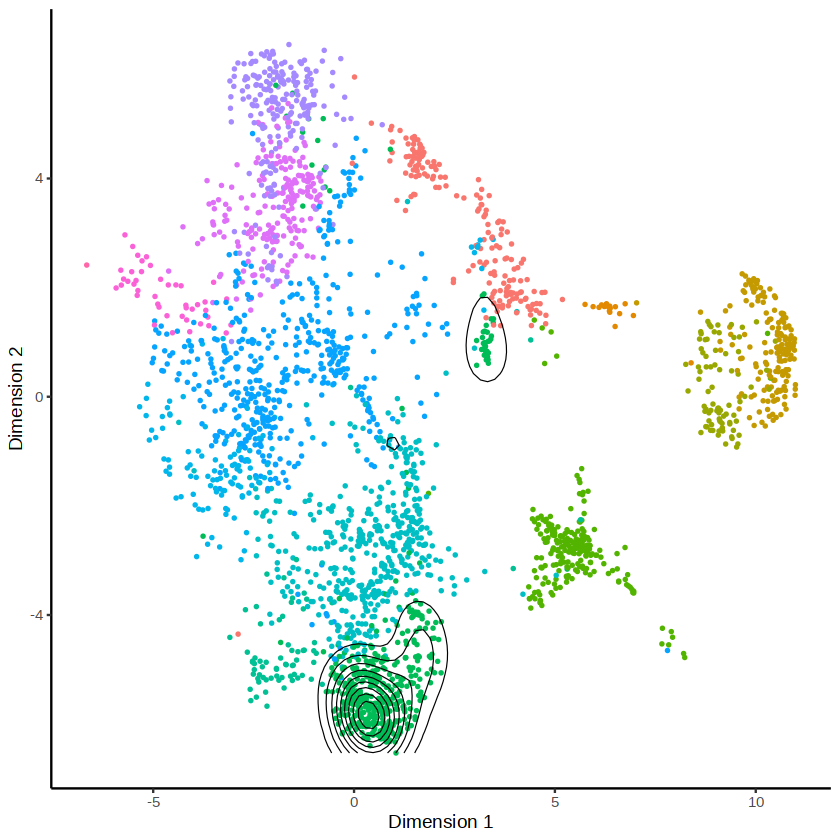

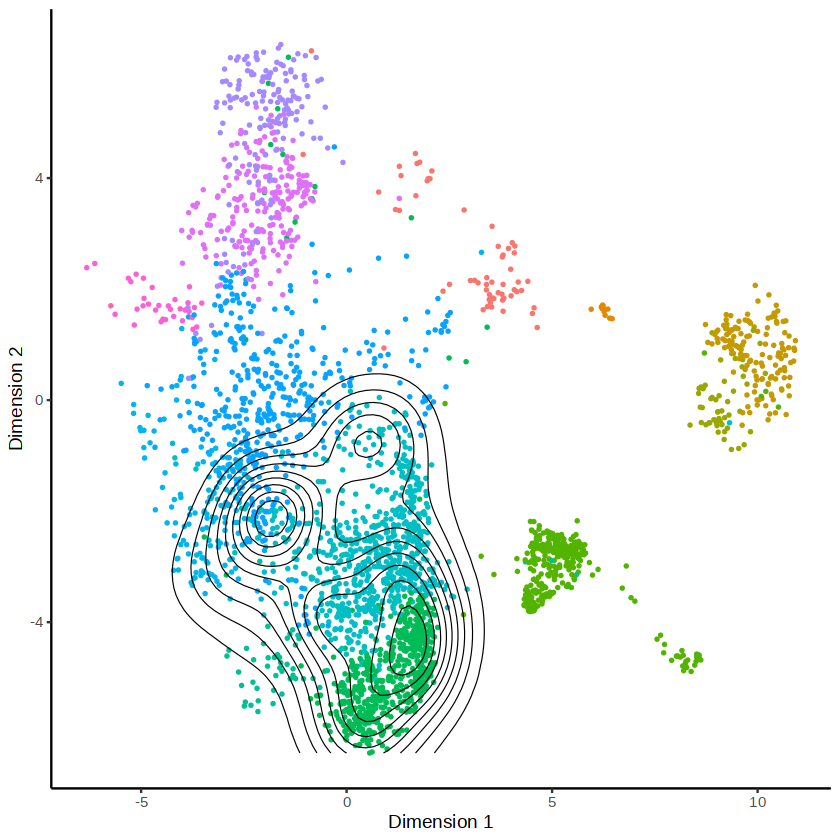

In [93]:
FT2 <- subset(FT_data_tumors, sampleID == "FT2")
FT1 <- subset(FT_data_tumors, sampleID == "FT1")
FT5 <- subset(FT_data_tumors, sampleID == "FT5")

clonalOverlay(FT2,
        reduction = "umap", 
        freq.cutpoint = 20, 
        bins = 10) + guides(color = "none")
clonalOverlay(FT1,
        reduction = "umap", 
        freq.cutpoint = 20, 
        bins = 10) + guides(color = "none")
clonalOverlay(FT5,
        reduction = "umap", 
        freq.cutpoint = 20, 
        bins = 10) + guides(color = "none")

In [80]:
View(FT_data_tumors@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,sampleID,tissue_type,nCount_SCT,nFeature_SCT,SCT_snn_res.1,seurat_clusters,⋯,SCT_snn_res.2,SCT_snn_res.3,barcode,CTgene,CTnt,CTaa,CTstrict,Frequency,cloneType,ID
,<chr>,<dbl>,<int>,<dbl>,<chr>,<chr>,<dbl>,<int>,<fct>,<fct>,⋯,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>
FT1_CTGCTGTAGGCTCTTA-1,FT1,15531,4830,3.1163479,FT1,tumor,2392,1477,7,1,⋯,8,35,FT1_CTGCTGTAGGCTCTTA-1,TRAV17.TRAJ29.TRAC_TRBV25-1.NA.TRBJ2-1.TRBC2,TGTGCTACGGACCCGAATTCAGGAAACACACCTCTTGTCTTT_TGTGCCAGCAGTAAGGGGGGATACAATGAGCAGTTCTTC,CATDPNSGNTPLVF_CASSKGGYNEQFF,TRAV17.TRAJ29.TRAC_TGTGCTACGGACCCGAATTCAGGAAACACACCTCTTGTCTTT_TRBV25-1.NA.TRBJ2-1.TRBC2_TGTGCCAGCAGTAAGGGGGGATACAATGAGCAGTTCTTC,1,Single (0 < X <= 1),a
FT1_GATCGTAAGGAGTTGC-1,FT1,14564,4943,1.1123318,FT1,tumor,2494,1637,5,6,⋯,0,10,FT1_GATCGTAAGGAGTTGC-1,TRAV5.TRAJ4.TRAC_TRBV20-1.TRBD2.TRBJ2-5.TRBC2,TGTGCAGAGACCGCTTCTGGTGGCTACAATAAGCTGATTTTT_TGCAGTGCCGGGACTAGCGGAGGTGAGACCCAGTACTTC,CAETASGGYNKLIF_CSAGTSGGETQYF,TRAV5.TRAJ4.TRAC_TGTGCAGAGACCGCTTCTGGTGGCTACAATAAGCTGATTTTT_TRBV20-1.TRBD2.TRBJ2-5.TRBC2_TGCAGTGCCGGGACTAGCGGAGGTGAGACCCAGTACTTC,2,Small (1 < X <= 5),a
FT1_GATGCTATCCAAACAC-1,FT1,11747,4589,1.0045118,FT1,tumor,2395,1688,12,5,⋯,19,13,NA,NA,NA,NA,NA,NA,NA,a
FT1_GGTGCGTAGAATAGGG-1,FT1,11345,4427,1.4808286,FT1,tumor,2400,1662,5,6,⋯,0,10,FT1_GGTGCGTAGAATAGGG-1,TRAV35.TRAJ39.TRAC_TRBV5-1.TRBD1.TRBJ1-5.TRBC1,TGTGCTGGGTATAATGCAGGCAACATGCTCACCTTT_TGCGCCAGCAGCTTGGGGGACAGGGAAGGGAATCAGCCCCAGCATTTT,CAGYNAGNMLTF_CASSLGDREGNQPQHF,TRAV35.TRAJ39.TRAC_TGTGCTGGGTATAATGCAGGCAACATGCTCACCTTT_TRBV5-1.TRBD1.TRBJ1-5.TRBC1_TGCGCCAGCAGCTTGGGGGACAGGGAAGGGAATCAGCCCCAGCATTTT,1,Single (0 < X <= 1),a
FT1_GACGGCTTCAGATAAG-1,FT1,10083,3782,1.6265000,FT1,tumor,2270,1309,3,7,⋯,18,12,NA,NA,NA,NA,NA,NA,NA,a
FT1_TTGGCAATCATCATTC-1,FT1,11462,4205,1.1429070,FT1,tumor,2491,1637,3,7,⋯,12,7,NA,NA,NA,NA,NA,NA,NA,a
FT1_CTCCTAGCACAAGACG-1,FT1,4312,2113,0.7189239,FT1,tumor,2933,1976,7,1,⋯,5,25,FT1_CTCCTAGCACAAGACG-1,TRAV1-2.TRAJ17.TRAC_TRBV6-1.NA.TRBJ2-6.TRBC2,TGTGCTGTGAGGCAAGCTGCAGGCAACAAGCTAACTTTT_TGTGCCAGCAGACTGACGGACACCCCTGGGGCCAACGTCCTGACTTTC,CAVRQAAGNKLTF_CASRLTDTPGANVLTF,TRAV1-2.TRAJ17.TRAC_TGTGCTGTGAGGCAAGCTGCAGGCAACAAGCTAACTTTT_TRBV6-1.NA.TRBJ2-6.TRBC2_TGTGCCAGCAGACTGACGGACACCCCTGGGGCCAACGTCCTGACTTTC,1,Single (0 < X <= 1),a
FT1_AGCTTGACAGCCTATA-1,FT1,10737,3913,0.9499860,FT1,tumor,2445,1493,7,1,⋯,8,35,NA,NA,NA,NA,NA,NA,NA,a
FT1_CATGCCTTCATCGCTC-1,FT1,9968,3849,1.3643660,FT1,tumor,2322,1437,12,5,⋯,19,13,NA,NA,NA,NA,NA,NA,NA,a


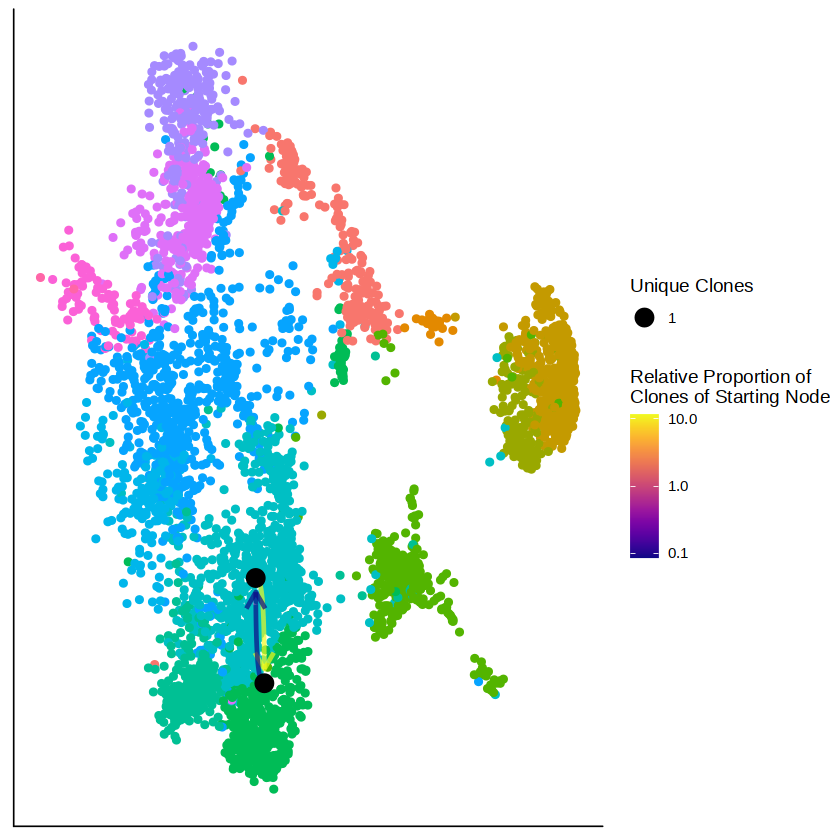

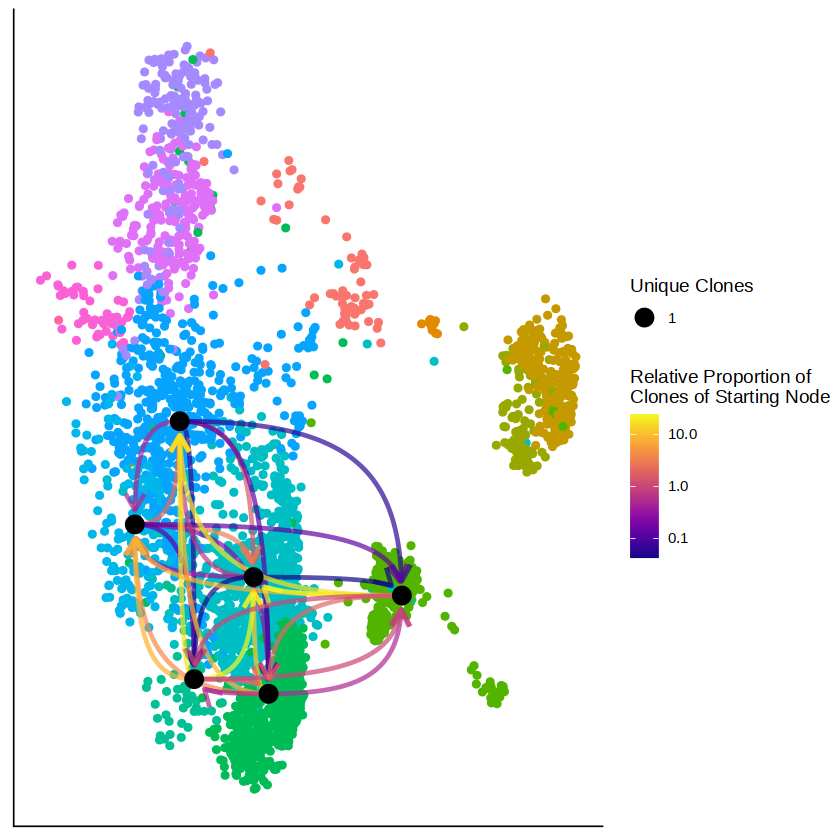

In [115]:
#ggraph needs to be loaded due to issues with ggplot
library(ggraph)
FT_data_adenoma <- subset(FT_data_tumors, subset = ID == "a")
FT_data_carcinoma <- subset(FT_data_tumors, subset = ID == "c")
#No Identity filter
clonalNetwork(FT_data_adenoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = 10,
              filter.identity = NULL,
              cloneCall = "aa")

clonalNetwork(FT_data_carcinoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = 10,
              filter.identity = NULL,
              cloneCall = "aa")

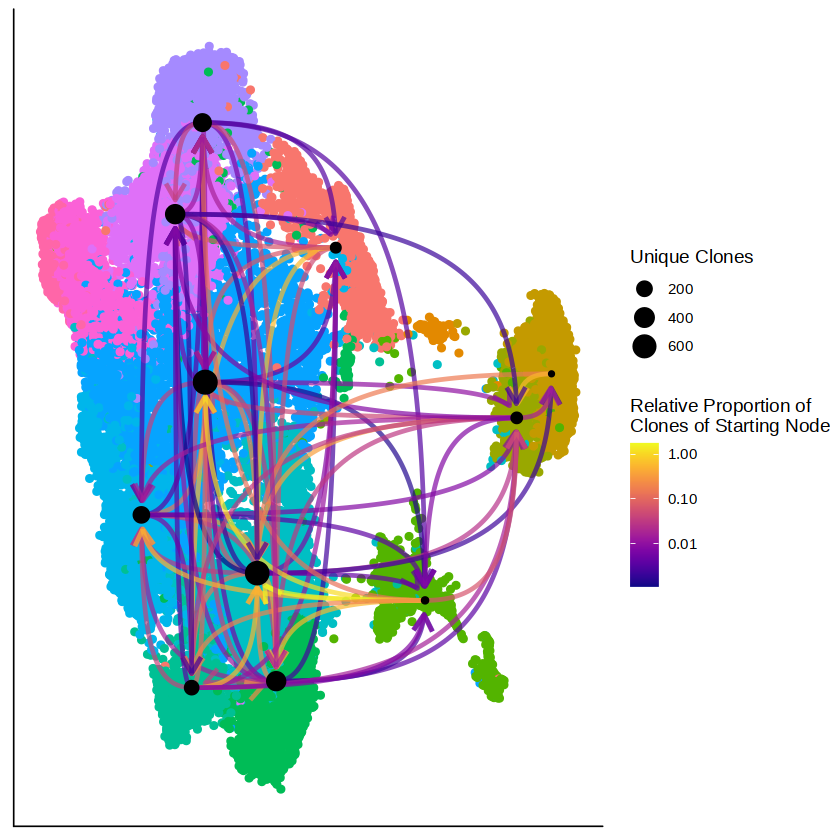

In [116]:
clonalNetwork(FT_data, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = NULL,
              filter.identity = NULL,
              cloneCall = "aa",
             )

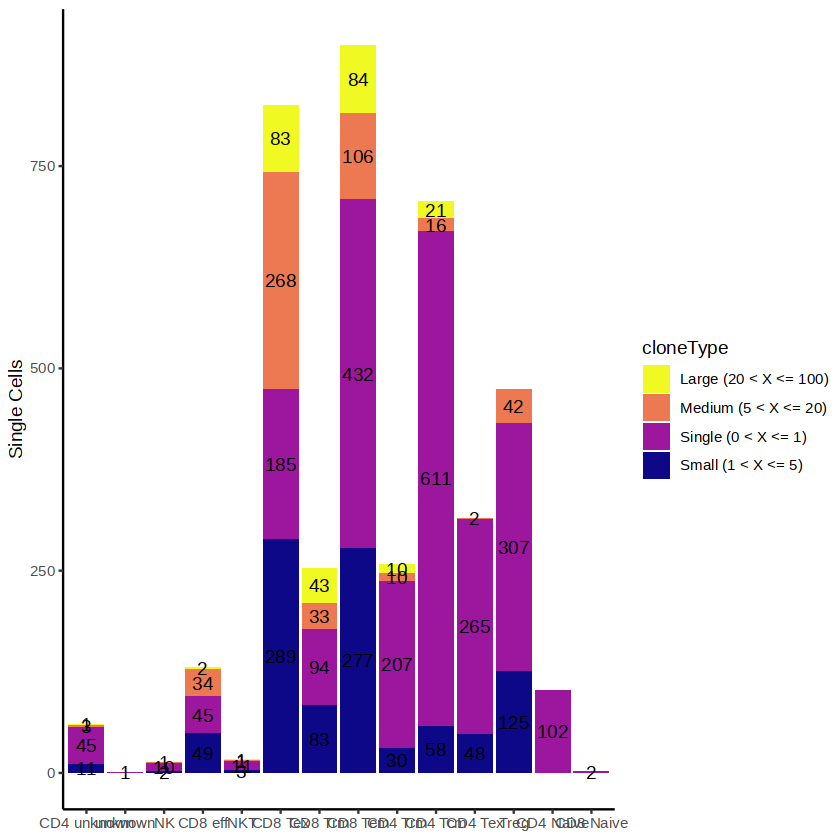

In [36]:
occupiedscRepertoire(FT_data, x.axis = "ident")

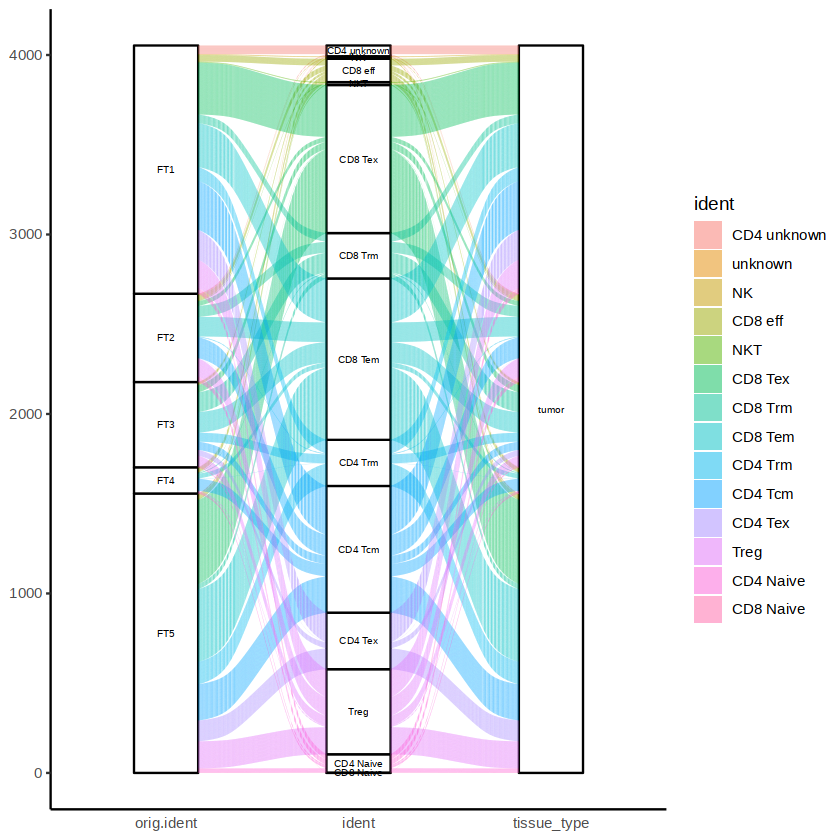

In [37]:
alluvialClonotypes(FT_data, cloneCall = "gene", 
                   y.axes = c("orig.ident", "ident", "tissue_type"), 
                   color = "ident")

In [42]:
suppressPackageStartupMessages(library(circlize))
library(scales)

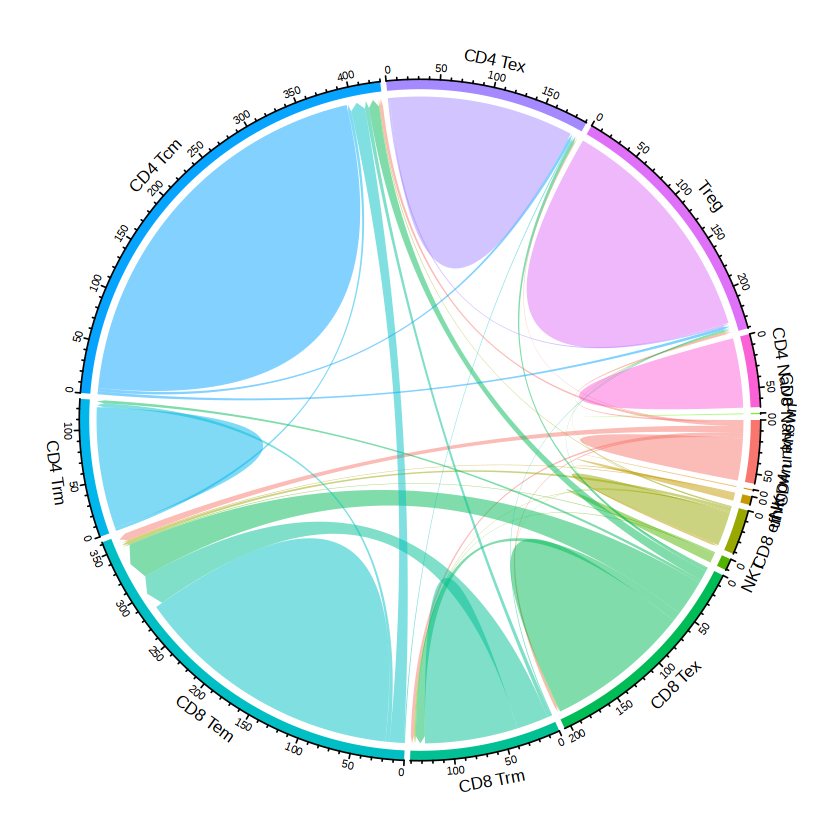

In [43]:
#adenoma
circles <- getCirclize(adenoma, group.by = "ident")

grid.cols <- scales::hue_pal()(length(unique(FT_data@active.ident)))
names(grid.cols) <- levels(subset@active.ident)

chordDiagram(circles, self.link = 1, 
             grid.col = grid.cols, directional = 1, 
             direction.type =  "arrows",
            link.arr.type = "big.arrow")

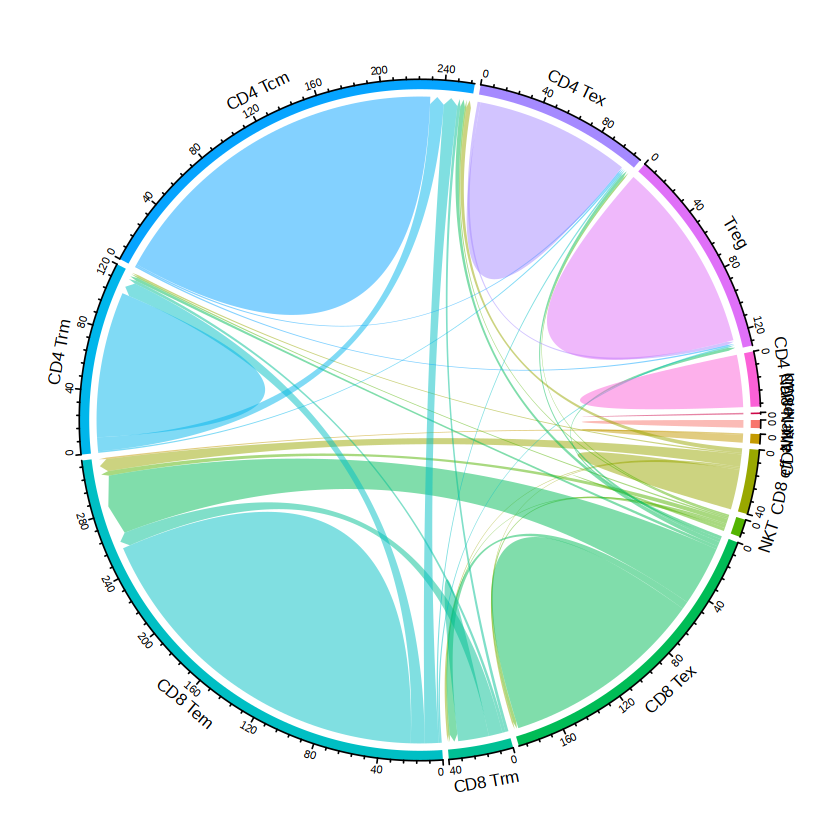

In [44]:
#carcinoma
circles <- getCirclize(carcinoma, group.by = "ident")

grid.cols <- scales::hue_pal()(length(unique(FT_data@active.ident)))
names(grid.cols) <- levels(subset@active.ident)

chordDiagram(circles, self.link = 1, 
             grid.col = grid.cols, directional = 1, 
             direction.type =  "arrows",
            link.arr.type = "big.arrow")

[2023-09-01 17:40:35] initialize Startrac ...
[2023-09-01 17:40:35] calculate startrac index ...
[2023-09-01 17:40:35] calculate pairwise index ...
[2023-09-01 17:40:36] calculate indices of each patient ...
[2023-09-01 17:40:37] collect result
[2023-09-01 17:40:37] return


Using aid, majorCluster as id variables

Warning message:
“Removed 39 rows containing non-finite values (`stat_boxplot()`).”


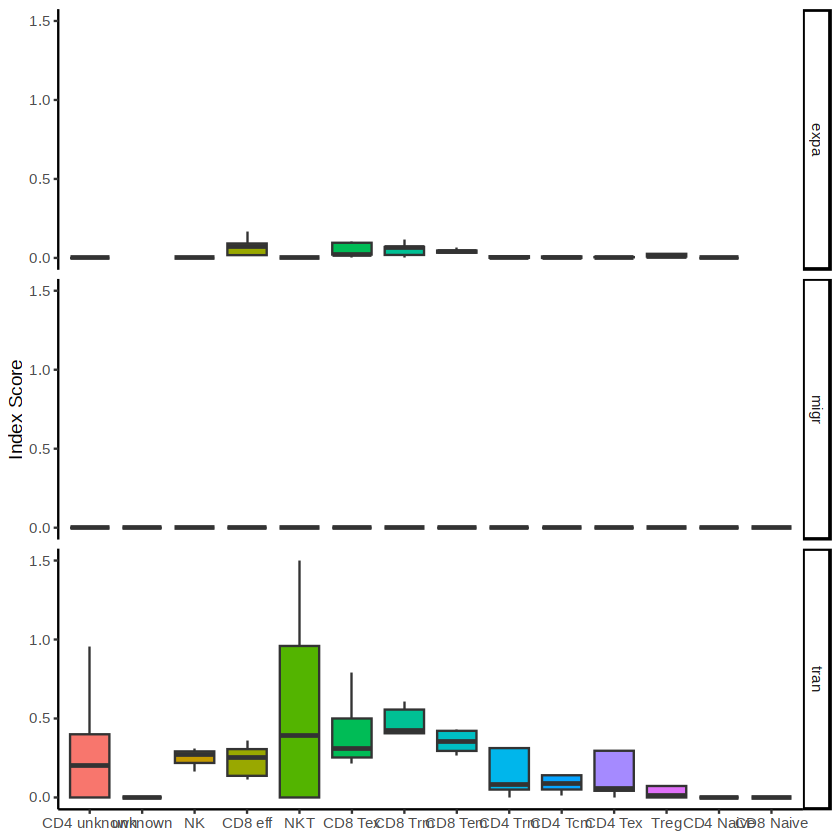

In [97]:
StartracDiversity(FT_data_tumors, 
                  type = "tissue_type", 
                  sample = "orig.ident", 
                  by = "overall")

In [24]:
combined2 <- expression2List(FT_data, split.by = "seurat_clusters")

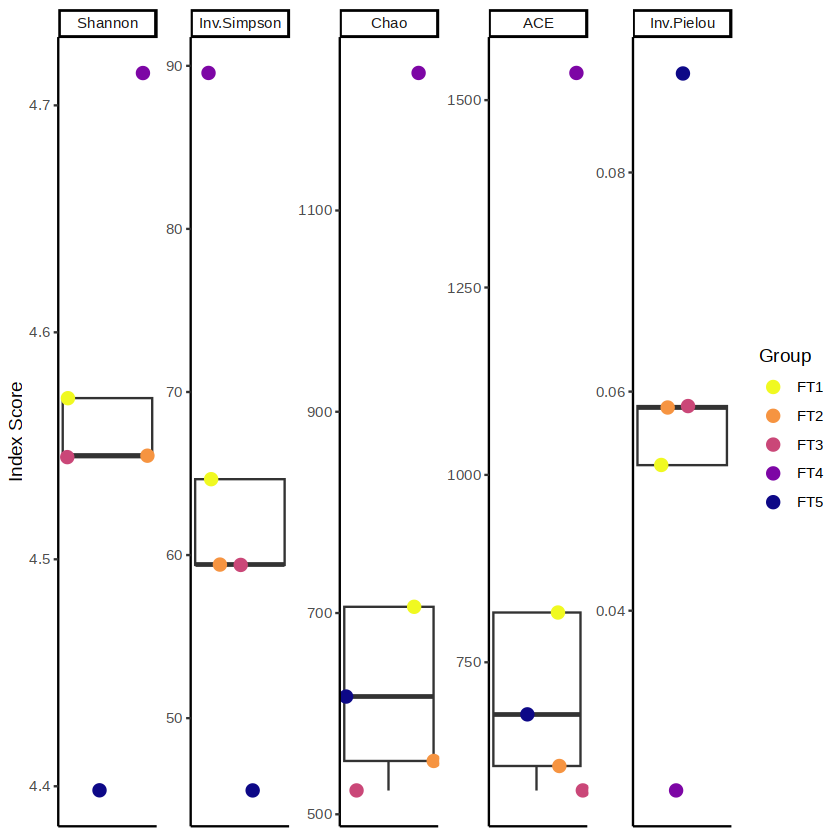

In [61]:
clonalDiversity(combined2, 
                cloneCall = "aa",
               group.by = "sampleID")

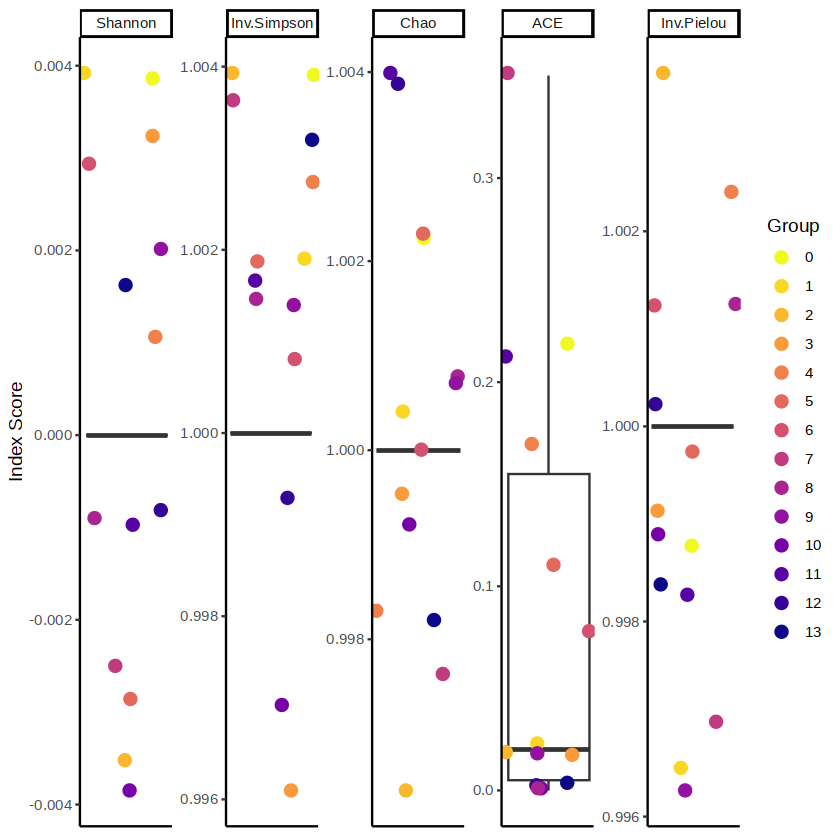

In [62]:
clonalDiversity(combined2, 
                cloneCall = "aa",
               group.by = "seurat_clusters")

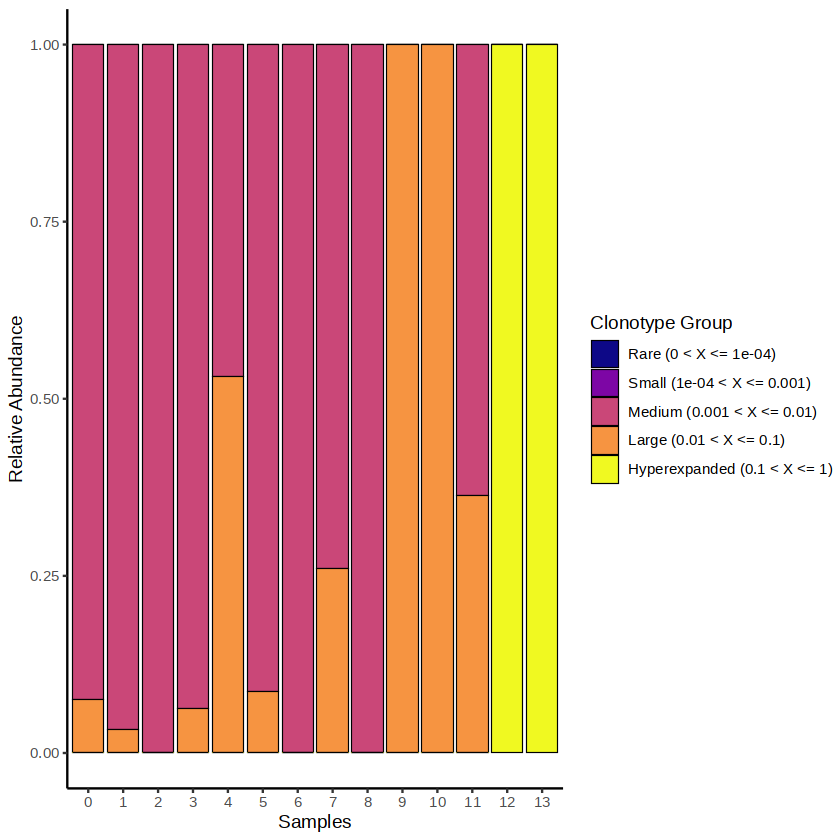

In [63]:
clonalHomeostasis(combined2, cloneCall = "aa")

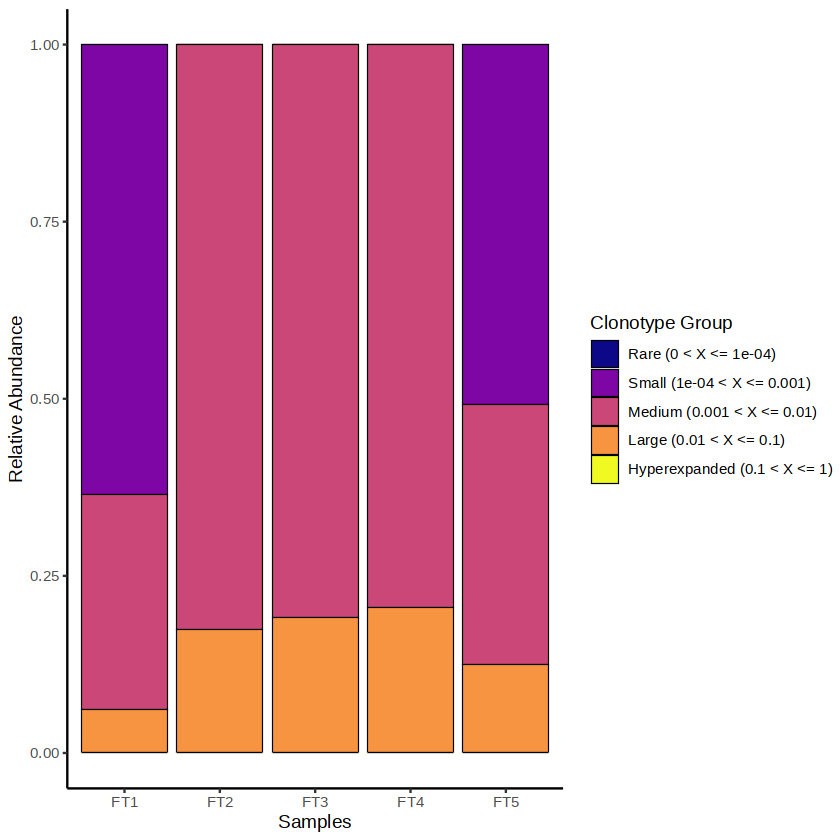

In [66]:
clonalHomeostasis(combined2, cloneCall = "aa", group.by = "sampleID")

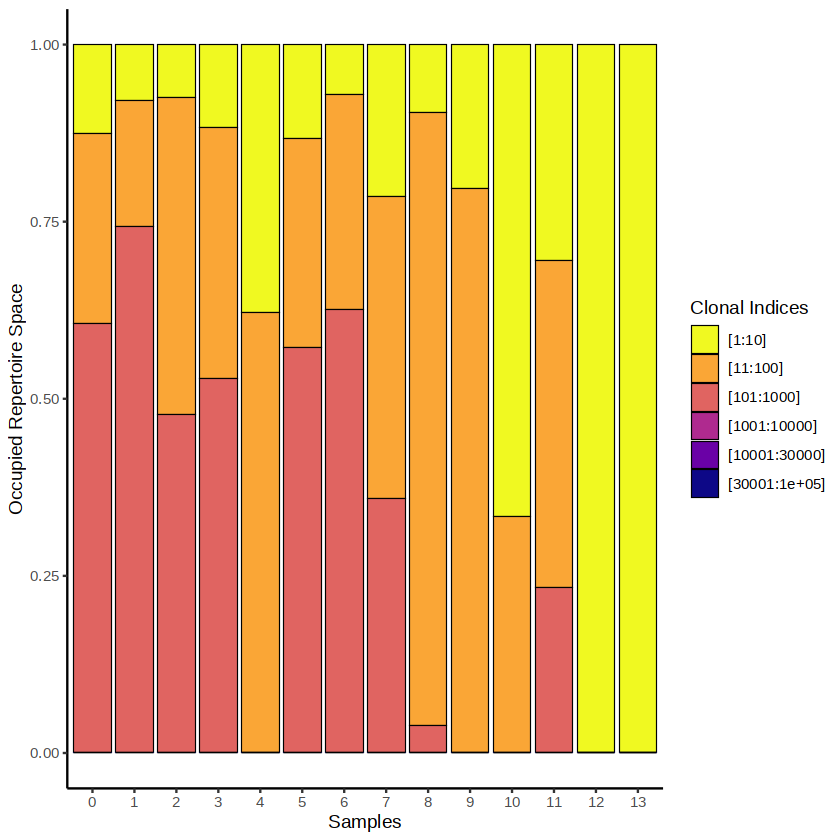

In [67]:
clonalProportion(combined2, cloneCall = "aa")

Warning message:
“Removed 91 rows containing missing values (`geom_text()`).”


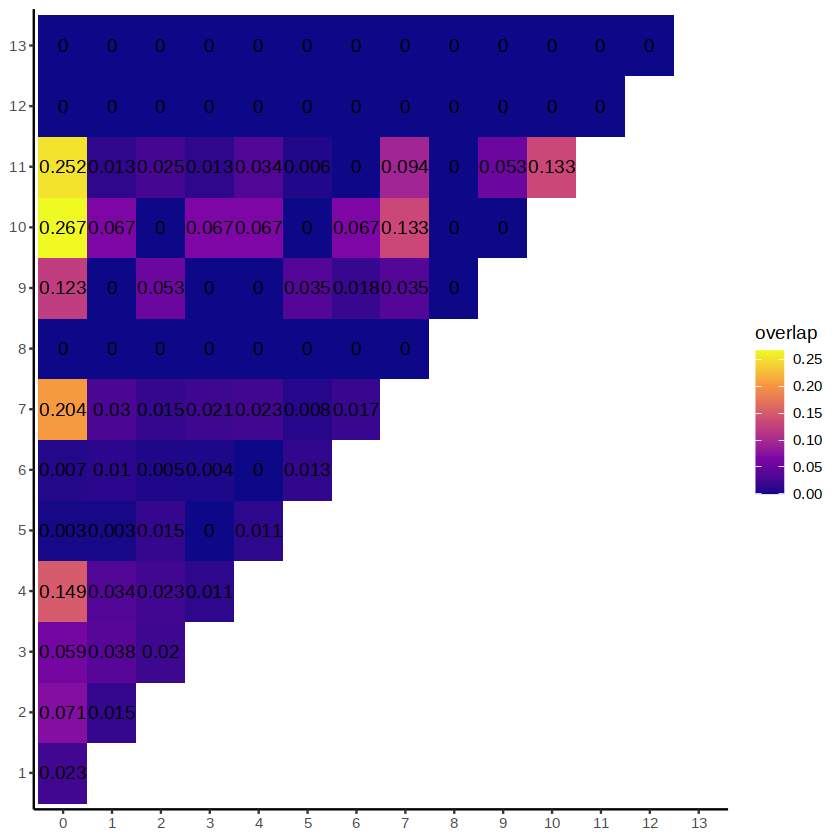

In [68]:
clonalOverlap(combined2, cloneCall = "aa", method = "overlap")

Warning message:
“Computation failed in `stat_quantile()`
Caused by error in `compute_group()`:
! The package "quantreg" is required for `stat_quantile()`”


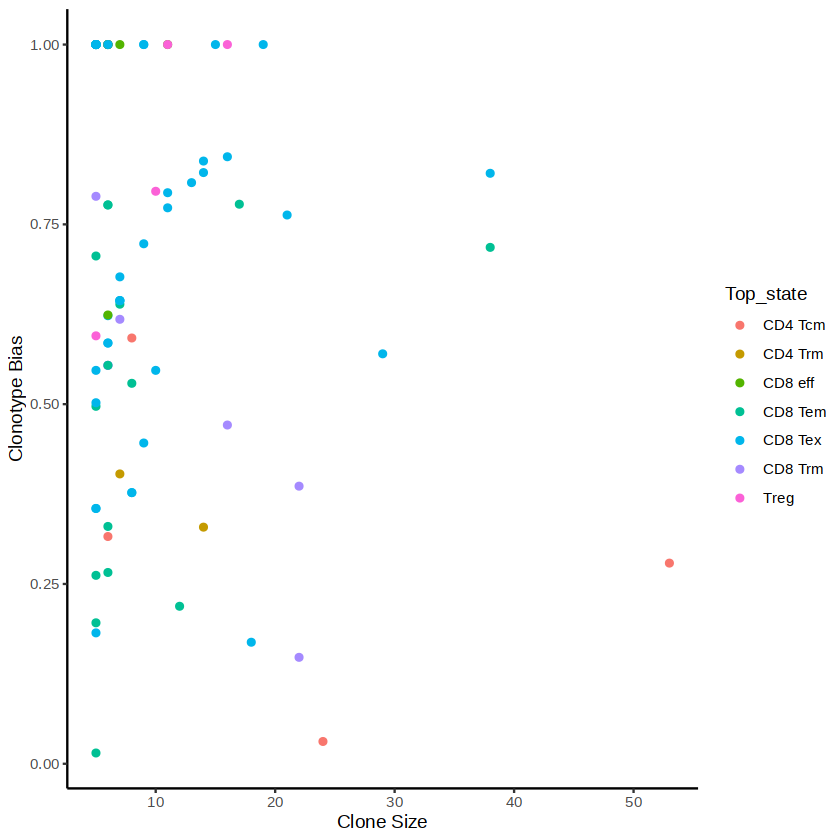

In [69]:
clonotypeBias(FT_data, 
              cloneCall = "aa", 
              split.by = "sampleID", 
              group.by = "ident",
              n.boots = 20, 
              min.expand = 5)

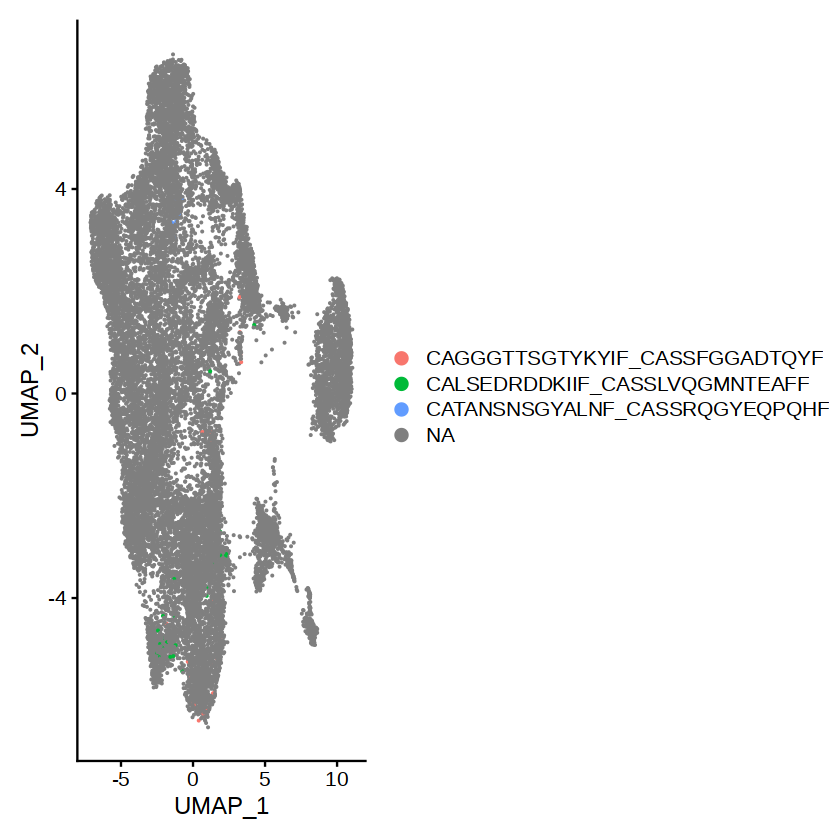

In [14]:
#adenoma에서 가장 많은 서열: FT1 FT2 FT3
FT_data <- highlightClonotypes(FT_data, 
              cloneCall= "aa", 
              sequence = c("CAGGGTTSGTYKYIF_CASSFGGADTQYF",
                           "CATANSNSGYALNF_CASSRQGYEQPQHF",
                          "CALSEDRDDKIIF_CASSLVQGMNTEAFF"))
DimPlot(FT_data, group.by = "highlight") + 
  theme(plot.title = element_blank())

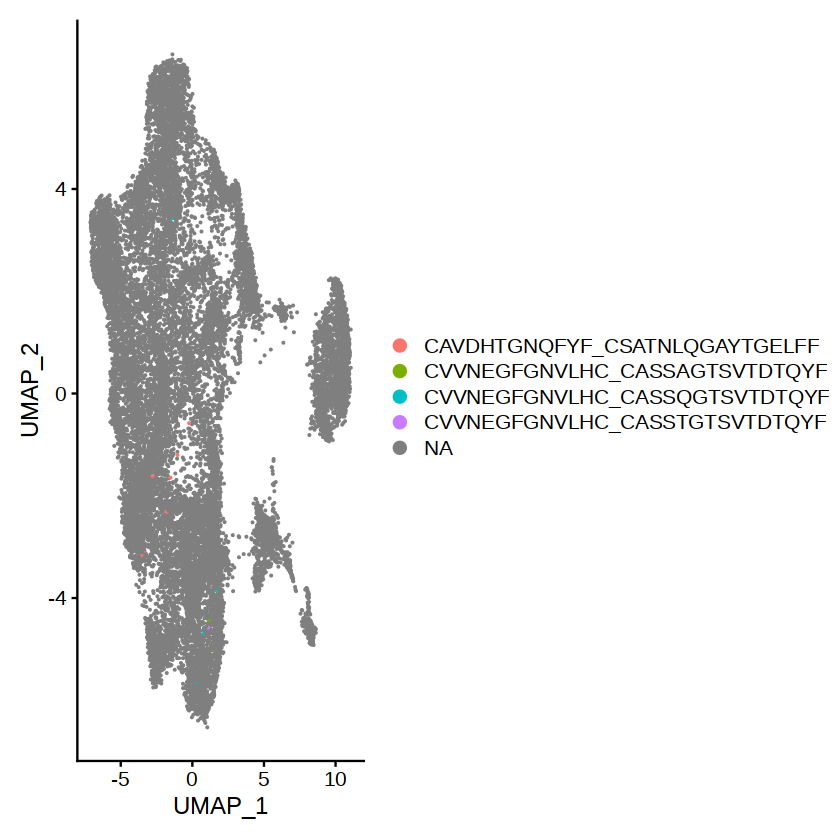

In [ ]:
#carcinoma에서 가장 많은 서열: FT5
FT_data <- highlightClonotypes(FT_data, 
              cloneCall= "aa", 
              sequence = c("CVVNEGFGNVLHC_CASSQGTSVTDTQYF",
                           "CVVNEGFGNVLHC_CASSAGTSVTDTQYF",
                          "CVVNEGFGNVLHC_CASSTGTSVTDTQYF",
                           "CAVDHTGNQFYF_CSATNLQGAYTGELFF"
                          ))
DimPlot(FT_data, group.by = "highlight") + 
  theme(plot.title = element_blank())

In [20]:
FT_data <- clusterTCR(FT_data,
                     chain = "TRB",
                     group.by = "sampleID", 
                     sequence = "aa", 
                     threshold = 0.85)

DimPlot(FT_data, group.by = "TRB_cluster") + 
  scale_color_manual(values = colorblind_vector(length(unique(FT_data@meta.data[,"TRB_cluster"])))) + 
  NoLegend()

ERROR: Error in str_split(dat[[y]]$CTaa, "_", simplify = TRUE)[, 1]: subscript out of bounds
